<img src="https://upload.wikimedia.org/wikipedia/commons/f/f3/Planet_Labs_logo.svg" alt="Drawing" style="width: 200px;"/>

# First Steps in Accessing Satellite Imagery with the Analyze APIs

Planet Insights Platform provides a suite of APIs for accessing satellite imagery. It allows you to retrieve satellite data, render images, and perform statistical analyses. In this notebook we will explore the core APIs for analysis.

In this notebook, we will learn how to:
- Quickly access satellite imagery (Sentinel-2 and PlanetScope) using the Processing API.
- Rewrite our evalscript to visualize Normalized Difference Vegetation Index (NDVI) using the Processing API. 
- Use Statistical API to produce NDVI time series for single and multiple fields with Sentinel-2 L2A and Analysis-Ready PlanetScope.

This notebook assumes basic familiarity with Python and common data science libraries (`pandas`, `matplotlib`, `numpy`). In this notebook we will also make use of the [`sentinelhub-py` Python library](https://sentinelhub-py.readthedocs.io/en/latest/index.html). To install this Python library, in your terminal you can use the following command: `pip install sentinelhub`. For more information, you can check the docs [here](https://sentinelhub-py.readthedocs.io/en/latest/install.html).

Let's import the notebook dependencies, followed by some utility functions that we will use to help us visualize the data later:

In [ ]:
# Utilities
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from typing import Any, Optional, Tuple
import numpy as np
import contextily as cx
import getpass
import warnings

from sentinelhub import (
    SHConfig,
    DataCollection,
    SentinelHubCatalog,
    SentinelHubRequest,
    SentinelHubStatistical,
    SentinelHubStatisticalDownloadClient,
    CRS,
    MimeType,
    Geometry,
    parse_time
)

In [3]:
# Helper Utility Functions

def plot_image(
    image: np.ndarray,
    factor: float = 1.0,
    clip_range: Optional[Tuple[float, float]] = None,
    **kwargs: Any
) -> None:
    """Utility function for plotting RGB images."""
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    if clip_range is not None:
        ax.imshow(np.clip(image * factor, *clip_range), **kwargs)
    else:
        ax.imshow(image * factor, **kwargs)
    ax.set_xticks([])
    ax.set_yticks([])

# define functions to extract statistics for all acquisition dates
def extract_stats(date, stat_data):
    d = {}
    for key, value in stat_data['outputs'].items():
        stats = value['bands']['B0']['stats']
        if stats['sampleCount']==stats['noDataCount']:
            continue
        else:
            d['date'] = [date]
            for stat_name, stat_value in stats.items():
                if (stat_name=='sampleCount' or stat_name=='noDataCount'):
                    continue
                else:
                    d[f'{key}_{stat_name}'] = [stat_value]
    return pd.DataFrame(d)

def read_acquisitions_stats(stat_data):
    df_li = []
    for aq in stat_data:
        date = aq['interval']['from'][:10]
        df = extract_stats(date, aq)
        if not df.empty:
            df_li.append(df)
    return pd.concat(df_li)

def stats_to_df(stats_data):
    """Transform Statistical API response into a pandas.DataFrame"""
    df_data = []

    for single_data in stats_data["data"]:
        df_entry = {}
        is_valid_entry = True

        df_entry["interval_from"] = parse_time(single_data["interval"]["from"]).date()
        df_entry["interval_to"] = parse_time(single_data["interval"]["to"]).date()

        for output_name, output_data in single_data["outputs"].items():
            for band_name, band_values in output_data["bands"].items():
                band_stats = band_values["stats"]
                if band_stats["sampleCount"] == band_stats["noDataCount"]:
                    is_valid_entry = False
                    break

                for stat_name, value in band_stats.items():
                    col_name = f"{output_name}_{band_name}_{stat_name}"
                    if stat_name == "percentiles":
                        for perc, perc_val in value.items():
                            perc_col_name = f"{col_name}_{perc}"
                            df_entry[perc_col_name] = perc_val
                    else:
                        df_entry[col_name] = value

        if is_valid_entry:
            df_data.append(df_entry)

    return pd.DataFrame(df_data)

## Credentials

Credentials (client_id & client_secret) can be obtained in your [account dashboard](https://insights.planet.com/account/#/). In the User Settings you can create a new OAuth Client to generate these credentials. For more detailed instructions, visit the relevant documentation page.

Now that you have your `client_id` & `client_secret`, it is recommended to configure a new profile in `sentinelhub-py`. Instructions can be found [here](https://sentinelhub-py.readthedocs.io/en/latest/configure.html). This is useful as changes to the `config` class are usually only temporary in your notebook and by saving the configuration to your profile you won't need to generate new credentials or overwrite/change the default profile each time you rerun or write a new Jupyter Notebook.

If this is your first time using `sentinelhub-py`, you should create a profile so you don't need to create new credentials each time you open up Jupyter Lab. You can do this in the following cell:

In [5]:
config = SHConfig()

if not config.sh_client_id or not config.sh_client_secret:
    print("No credentials found, please provide the OAuth client ID and secret.")
    config.sh_client_id = getpass.getpass("sh_client_id: ")
    config.sh_client_secret = getpass.getpass("sh_client_secret: ")
    config.save()
    print(f"Credentials saved to {SHConfig.get_config_location()}")
else:
    print(f"Using credentials stored here: {SHConfig.get_config_location()}")

No credentials found, please provide the OAuth client ID and secret.
Credentials saved to C:\Users\mattballard/.config\sentinelhub\config.toml


## Setting an area of interest

First, we need to define our area of interest (AOI). For this example, we will use an area near Groningen, Netherlands, defined as a GeoJSON string. If you wish, you can try putting in your own area of interest. It intersects an AOI part of the [Analysis-Ready PlanetScope Sandbox Data](https://docs.planet.com/data/imagery/arps/sandbox/) made available as part of the Planet Sandbox Data. 

In [6]:
aoi_geojson = """{
  "type": "Polygon",
  "coordinates": [
    [
      [
        6.017953,
        53.075046
      ],
      [
        6.210106,
        53.075046
      ],
      [
        6.210106,
        53.175582
      ],
      [
        6.017953,
        53.175582
      ],
      [
        6.017953,
        53.075046
      ]
    ]
  ]
}"""

We can then visualize the AOI using `geopandas`:

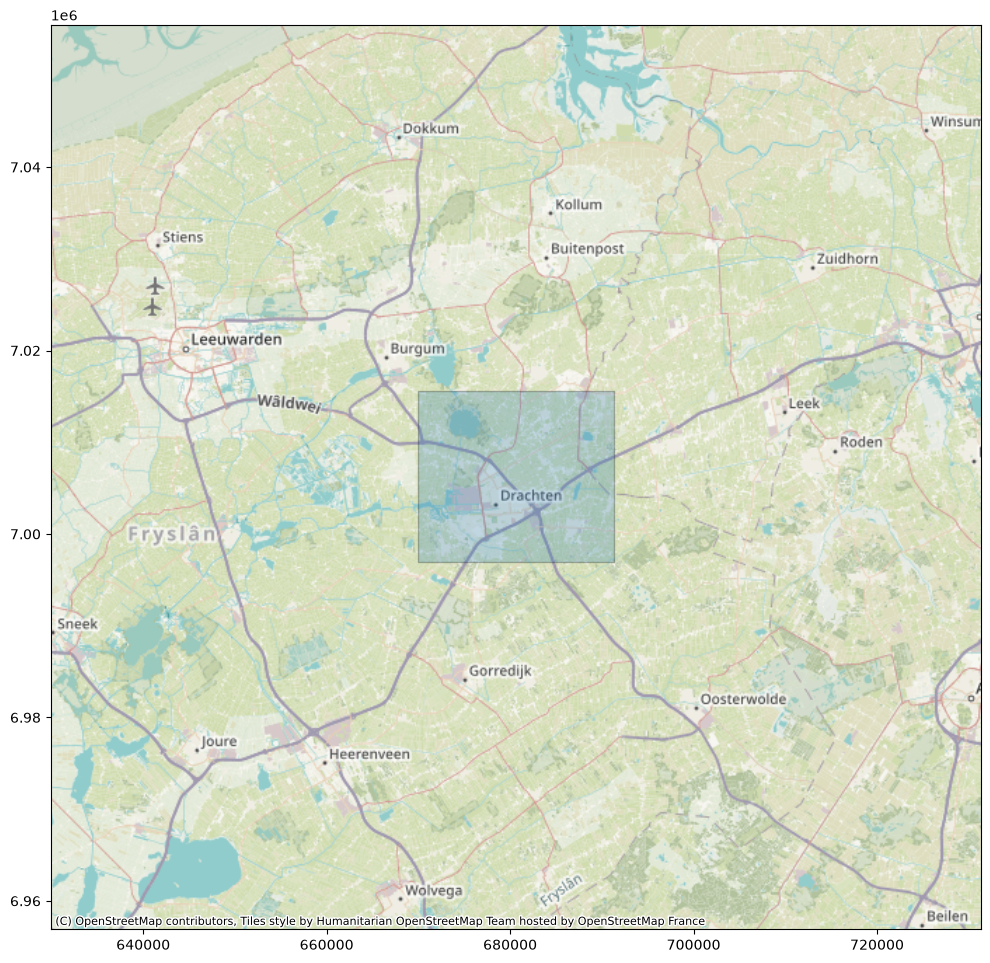

In [43]:
aoi = gpd.read_file(aoi_geojson)
aoi["area"] = aoi.area
aoi_wm = aoi.to_crs(epsg=3857)

# Plot the AOI with a basemap
ax = aoi_wm.plot(alpha=0.25, edgecolor="k", figsize=(12, 12))

# Zoom out by adding padding around the AOI bounds
pad = 40000  # meters of padding
xmin, ymin, xmax, ymax = aoi_wm.total_bounds
ax.set_xlim(xmin - pad, xmax + pad)
ax.set_ylim(ymin - pad, ymax + pad)

# Add a higher-resolution basemap (zoom=11 for sharper tiles)
cx.add_basemap(ax, zoom=10)

## Processing API

### Example 1: True Color Image

We build the request according to the [API Reference](https://docs.planet.com/develop/apis/processing/reference/), using the `SentinelHubRequest` class. Each Processing API request also needs an [evalscript](https://docs.planet.com/develop/evalscripts/). An evalscript (or "custom script") is a piece of JavaScript code which defines how the satellite data is processed and what values the API returns. It is a required part of any [processing](https://docs.planet.com/develop/apis/processing/), [batch processing](https://docs.planet.com/develop/apis/batch-processing/) or [OGC request](https://docs.planet.com/platform/integrations/ogc/).

The information that we specify in the `SentinelHubRequest` object is:
- an evalscript,
- a list of input data collections with time interval,
- a format of the response,
- a bounding box and its size (size or resolution).
- `mosaickingOrder` (optional): in this example we have used `leastCC` which will return pixels from the least cloudy acquisition in the specified time period.

The evalscript in the example is used to select the appropriate bands. We return the RGB (B04, B03, B02) Sentinel-2 L2A bands.

The least cloudy image from the time period is downloaded. Without any additional parameters in the evalscript, the downloaded data will correspond to reflectance values in `UINT8` format (values in 0-255 range).

In [8]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2023-06-01", "2023-06-10"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},)
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    size=[1200,1200],
    config=config,
)

The method `get_data()` will always return a list of length 1 with the available image from the requested time interval in the form of numpy arrays.

In [9]:
true_color_imgs = request_true_color.get_data()

In [10]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (1200, 1200, 3)


Image type: uint8


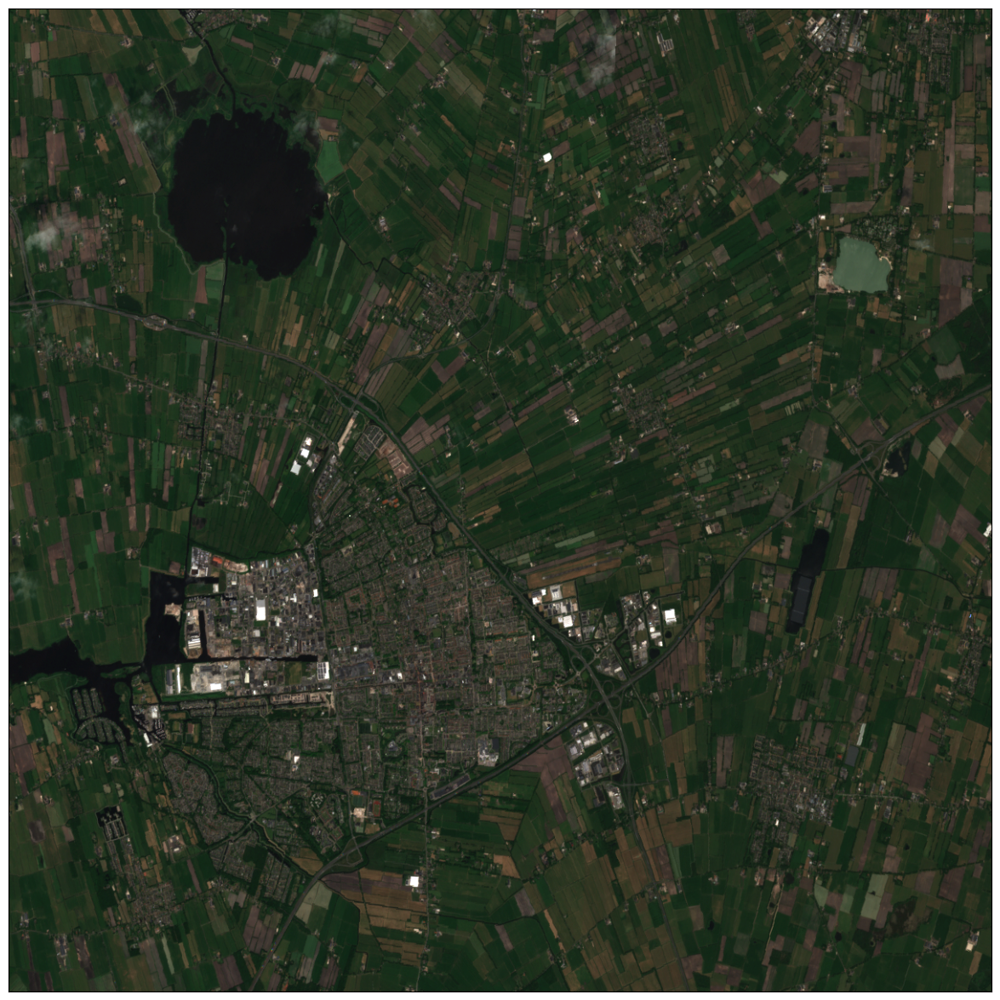

In [ ]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 2.5 to increase brightness
plot_image(image, factor=2.5 / 255, clip_range=(0, 1))

Try it yourself! Can you adjust the cells to do these?
- False color composite using the NIR band?
- Manipulate the image brighter or with more contrast?
- Visualize different dates?

### Example 2: Normalized Difference Vegetation Index (NDVI) Request

Next, we will show you an example of how to calculate and visualize NDVI using the same API. NDVI is a very commonly used spectral vegetation index for vegetation monitoring, for example, monitoring crop growth and yields. As you will notice in the codeblock below, the evalscript has changed substantially:
- We are only using band 4 and band 8 as an input into our script.
- In the `evaluatePixel()` function, we calculate NDVI and map the value to an RGB color using the `imgVals` array.

In [12]:
evalscript_ndvi = """
//VERSION=3
function setup() {
  return {
    input: [{
      bands: [
        "B04",
        "B08",
        "dataMask"
      ]
    }],
    output: {
      bands: 4
    }
  }
}
  

function evaluatePixel(sample) {
    let val = (sample.B08 - sample.B04) / (sample.B08 + sample.B04);
    let imgVals = null;
    
    if (val<-1.1) imgVals = [0,0,0];
    else if (val<-0.2) imgVals = [0.75,0.75,0.75];
    else if (val<-0.1) imgVals = [0.86,0.86,0.86];
    else if (val<0) imgVals = [1,1,0.88];
    else if (val<0.025) imgVals = [1,0.98,0.8];
    else if (val<0.05) imgVals = [0.93,0.91,0.71];
    else if (val<0.075) imgVals = [0.87,0.85,0.61];
    else if (val<0.1) imgVals = [0.8,0.78,0.51];
    else if (val<0.125) imgVals = [0.74,0.72,0.42];
    else if (val<0.15) imgVals = [0.69,0.76,0.38];
    else if (val<0.175) imgVals = [0.64,0.8,0.35];
    else if (val<0.2) imgVals = [0.57,0.75,0.32];
    else if (val<0.25) imgVals = [0.5,0.7,0.28];
    else if (val<0.3) imgVals = [0.44,0.64,0.25];
    else if (val<0.35) imgVals = [0.38,0.59,0.21];
    else if (val<0.4) imgVals = [0.31,0.54,0.18];
    else if (val<0.45) imgVals = [0.25,0.49,0.14];
    else if (val<0.5) imgVals = [0.19,0.43,0.11];
    else if (val<0.55) imgVals = [0.13,0.38,0.07];
    else if (val<0.6) imgVals = [0.06,0.33,0.04];
    else imgVals = [0,0.27,0];
    
    
    imgVals.push(sample.dataMask)
    
    return imgVals
}
"""

request_ndvi_img = SentinelHubRequest(
    evalscript=evalscript_ndvi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A,
            time_interval=("2023-06-01", "2023-06-10"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    size=[1200,1200],
    config=config,
)

The same method as before is used to request and then visualize the data. In the visualization, the darker greens indicate a higher NDVI value (vegetation, forest) and the lighter greens (urban areas and water bodies) represent areas with lower NDVI values.

In [13]:
ndvi_img = request_ndvi_img.get_data()

In [14]:
print(
    f"Returned data is of type = {type(ndvi_img)} and length {len(ndvi_img)}."
)
print(
    f"Single element in the list is of type {type(ndvi_img[-1])} and has shape {ndvi_img[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (1200, 1200, 4)


Image type: uint8


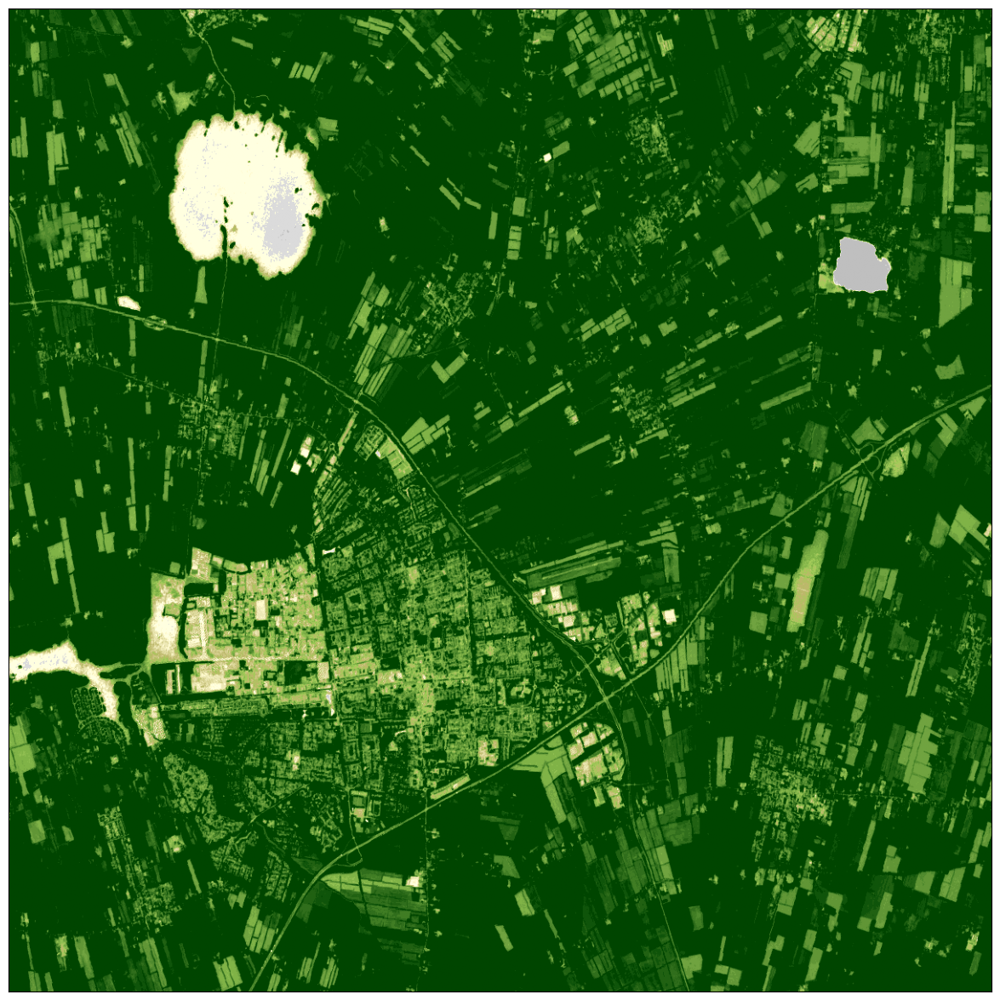

In [15]:
image = ndvi_img[0]
print(f"Image type: {image.dtype}")

# plot function
plot_image(image, factor=1 / 255)

## True color and NDVI for PlanetScope imagery

In this example, we will show how you can make a Processing API request, but this time visualizing a true color image derived from Analysis-Ready PlanetScope data. 

In [16]:
evalscript_true_color = """
//VERSION=3

function setup() {
    return {
        input: [{
            bands: ["blue", "green", "red", "dataMask"],
        }],
        output: {
            bands: 4
        }
    };
}

let factor = 1/2000;
function evaluatePixel(sample) {
    return [
        factor * sample.red,
        factor * sample.green,
        factor * sample.blue,
        sample.dataMask

];
}
"""
request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'),
            time_interval=("2023-06-10", "2023-06-10"),            
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    size=[1200,1200],
    config=config,
)

In [17]:
true_color_imgs = request_true_color.get_data()

In [18]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (1200, 1200, 4)


Image type: uint8


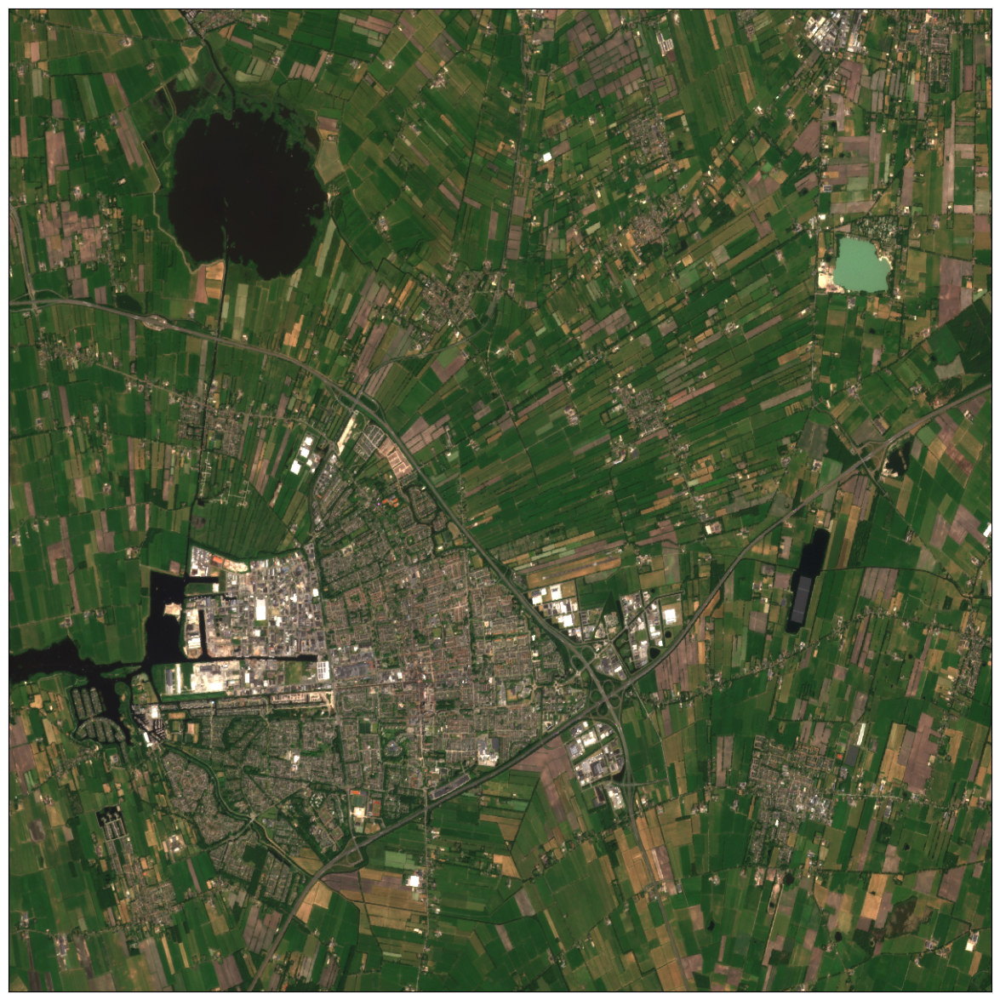

In [19]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=1 / 255, clip_range=(0, 1))

## How to download your PlanetScope image at specific resolutions?

In this request, we specify a resolution instead of the image size in pixels. You can see the resolution is defined as `resolution=[0.00005,0.00005]`.

In this example, the native projection used is WGS84 so the units used are in degrees corresponding to approximately 5mx5m per pixel. If your AOI and output was projected in UTM, then you would use meters as your unit of measurement.

In [20]:
download_true_color = SentinelHubRequest(
    data_folder="planet_downloads",
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'),
            time_interval=("2023-06-10", "2023-06-10"),            
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=Geometry(geometry=aoi.geometry.values[0], crs=CRS.WGS84),
    resolution=[0.00005,0.00005],
    config=config,
)

In this second cell, instead of displaying the data, we actually save it to file. This can then be used with a GIS (ArcGIS or QGIS) for further analysis. 

In [21]:
download = download_true_color.get_data(save_data=True)
download

DownloadFailedException: Failed to download from:
https://services.sentinel-hub.com/api/v1/process
with HTTPError:
400 Client Error: Bad Request for url: https://services.sentinel-hub.com/api/v1/process
Server response: "{"status": 400, "reason": "Bad Request", "message": "`width = 3843`, calculated from resx, is larger than allowed 2500.\n", "code": "COMMON_BAD_PAYLOAD", "errors": [{"parameter": "output->resx", "violation": "`width = 3843`, calculated from resx, is larger than allowed 2500."}]}"

Whoops! We have encountered an error! If we read into this we can see that the image we have requested would be 3843x3843 pixels! This is over the limit of 2500×2500 pixels that is set for Processing API requests. Therefore, to return a high resolution image we need to reduce the size of our AOI. If you do need to extract larger areas at full resolution, you can look into [Async Processing API](https://docs.planet.com/develop/apis/async-processing/) with a maximum image size of 10,000×10,000 pixels or even [Batch Processing API](https://docs.planet.com/develop/apis/batch-processing/). 

In [22]:
smaller_aoi_geojson = """{
  "type": "Polygon",
  "coordinates": [
    [
      [
        6.088831,
        53.107215
      ],
      [
        6.14261,
        53.107215
      ],
      [
        6.14261,
        53.13606
      ],
      [
        6.088831,
        53.13606
      ],
      [
        6.088831,
        53.107215
      ]
    ]
  ]
}"""

Let's visualize the smaller AOI:

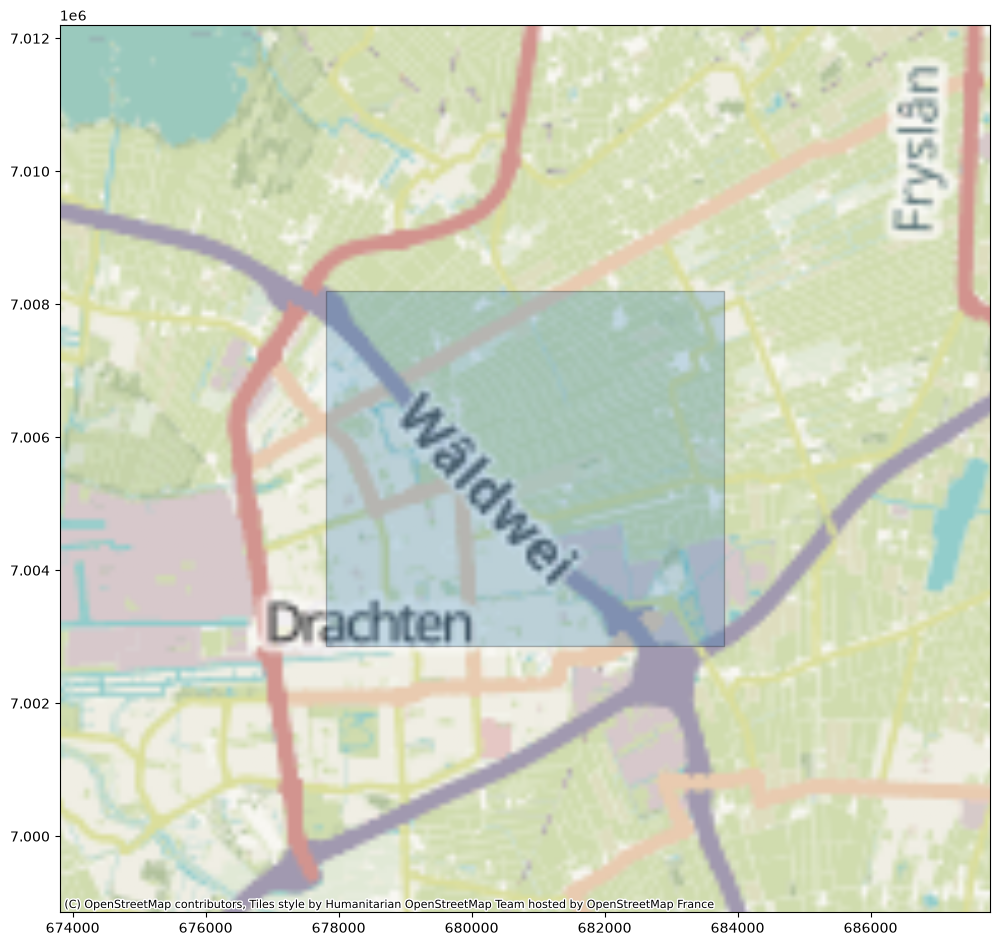

In [23]:
smaller_aoi = gpd.read_file(smaller_aoi_geojson)
smaller_aoi["area"] = smaller_aoi.area
smaller_aoi_wm = smaller_aoi.to_crs(epsg=3857)

# Plot the AOI with a basemap
ax = smaller_aoi_wm.plot(alpha=0.25, edgecolor="k", figsize=(12, 12))

# Zoom out by adding padding around the AOI bounds
pad = 4000  # meters of padding
xmin, ymin, xmax, ymax = smaller_aoi_wm.total_bounds
ax.set_xlim(xmin - pad, xmax + pad)
ax.set_ylim(ymin - pad, ymax + pad)

# Add a higher-resolution basemap (zoom=11 for sharper tiles)
cx.add_basemap(ax, zoom=11)

and rerun the request...

In [24]:
download_true_color = SentinelHubRequest(
    data_folder="planet_downloads",
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'),
            time_interval=("2023-06-10", "2023-06-10"),            
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=Geometry(geometry=smaller_aoi.geometry.values[0], crs=CRS.WGS84),
    resolution=[0.00005,0.00005],
    config=config,
)

This time the request will work and the image is saved to disk.

In [25]:
download = download_true_color.get_data(save_data=True)
download

[array([[[113,  97,  76, 255],
         [118, 100,  75, 255],
         [131, 107,  84, 255],
         ...,
         [ 60,  71,  42, 255],
         [ 54,  69,  40, 255],
         [ 54,  69,  41, 255]],
 
        [[120, 110,  83, 255],
         [125, 111,  84, 255],
         [132, 113,  89, 255],
         ...,
         [ 74,  83,  56, 255],
         [ 77,  80,  54, 255],
         [ 67,  76,  46, 255]],
 
        [[110, 101,  75, 255],
         [119, 105,  81, 255],
         [129, 114,  88, 255],
         ...,
         [ 86,  91,  67, 255],
         [ 92,  91,  67, 255],
         [100,  97,  72, 255]],
 
        ...,
 
        [[ 83,  79,  63, 255],
         [ 85,  83,  67, 255],
         [ 89,  88,  68, 255],
         ...,
         [ 56,  74,  43, 255],
         [ 58,  78,  42, 255],
         [ 55,  79,  41, 255]],
 
        [[ 79,  75,  67, 255],
         [ 82,  81,  70, 255],
         [ 91,  90,  71, 255],
         ...,
         [ 63,  84,  45, 255],
         [ 55,  80,  44, 255],
    

## Statistical API

In the Processing API examples above, we saw how to obtain satellite imagery. [Statistical API](https://docs.planet.com/develop/apis/statistical/) can be used in a very similar way. The main difference is that the results of Statistical API are aggregated statistical values of satellite data instead of entire images. In many use cases, such values are all that we need. By using Statistical API we can avoid downloading and processing large amounts of satellite data.

All general rules for building evalscripts apply. However, there are some specifics when using evalscripts with the Statistical API:

- The `evaluatePixel()` function must, in addition to other output, always return a `dataMask` output. This output defines which pixels are excluded from calculations. For more details and an example, see [here](https://docs.planet.com/develop/apis/statistical/#exclude-pixels-from-calculations-datamask-output).
- The default value of sampleType is `FLOAT32`.
- The output.bands parameter in the setup() function can be an array. This makes it possible to specify custom names for the output bands and different output `dataMask` for different outputs, see this [example](https://docs.planet.com/develop/apis/statistical/examples/#multiple-outputs-with-different-datamasks-multi-band-output-with-custom-bands-names-and-different-histogram-types).

In this example, we have chosen a selection of agricultural fields in the Netherlands. The data collection we are using is the [PlanetScope Sandbox Data Collection](https://docs.planet.com/data/imagery/planetscope/sandbox/).

In [26]:
fields="""{
"type": "FeatureCollection",
"name": "nederlands_fields",
"crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:OGC:1.3:CRS84" } },
"features": [
{ "type": "Feature", "properties": { "id": 1 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 6.132773148172918, 53.125275103427057 ], [ 6.133098979260973, 53.124585344616797 ], [ 6.131098738414858, 53.124205157863287 ], [ 6.130763856463248, 53.124862335705323 ], [ 6.132773148172918, 53.125275103427057 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 2 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 6.123387402664229, 53.125117600421994 ], [ 6.126663815271892, 53.125850799155643 ], [ 6.127089205859074, 53.125161049584499 ], [ 6.123803742387855, 53.124438701553139 ], [ 6.123387402664229, 53.125117600421994 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 3 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 6.124853642560476, 53.123640302762531 ], [ 6.127206867085316, 53.124126404472449 ], [ 6.127668461126728, 53.123409470416483 ], [ 6.125229253398094, 53.122939654871253 ], [ 6.124853642560476, 53.123640302762531 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 4 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 6.136606188889343, 53.126106058001639 ], [ 6.138597378871899, 53.126497089889448 ], [ 6.139022769459081, 53.125687867184666 ], [ 6.136972748863404, 53.1253049746215 ], [ 6.136606188889343, 53.126106058001639 ] ] ] ] } },
{ "type": "Feature", "properties": { "id": 5 }, "geometry": { "type": "MultiPolygon", "coordinates": [ [ [ [ 6.134234862637389, 53.123146048459979 ], [ 6.134470185089873, 53.122635494091973 ], [ 6.132361333881074, 53.122244427070306 ], [ 6.132089807974361, 53.122782143307838 ], [ 6.134234862637389, 53.123146048459979 ] ] ] ] } }
]
}

"""

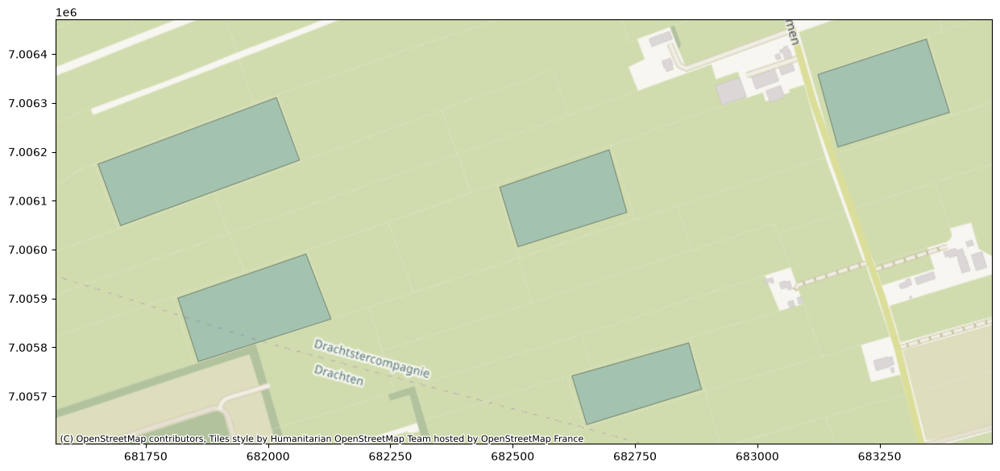

In [37]:
fields_gdf = gpd.read_file(fields)
fields_gdf["area"] = fields_gdf.geometry.area

fields_gdf_wm = fields_gdf.to_crs(epsg=3857)

# Explore the GeoDataFrame, visualizing the 'area' column with a specified colormap
ax = fields_gdf_wm.plot(alpha=0.25, edgecolor="k", figsize = (15,15))
cx.add_basemap(ax)

### Requesting, and plotting an NDVI time series for a single field

In the example here, we will calculate NDVI for a specific field of interest and then plot the mean NDVI and standard deviation over the requested time period. By the end of this section, you'll have a time series chart showing how NDVI changed over the growing season. First we define our evalscript:

In [28]:
evalscript = """
//VERSION=3
//NDVI

function setup() {
  return {
    input: [{
      bands: [
        "red",
        "nir",
        "dataMask",
      ]
    }],
    output: [
      { id: "index", bands: 1, sampleType: "FLOAT32" },
      { id: "dataMask", bands: 1 },
    ]
  }
}

function evaluatePixel(samples) {
  let ndvi = (samples.nir - samples.red) / (samples.nir + samples.red);
  const indexVal = samples.dataMask === 1 ? ndvi : NaN;  

  return {
    index: [indexVal],
    dataMask: [samples.dataMask],
  };
}
"""

In this example, we will plot a time series for a single field within the area we requested using the Processing API:

Now we have defined the evalscript and the fields of interest, we can build the first Statistical API Request, before returning the response for the first field. In this request, as part of the payload we define some input parameters:
- `time_interval` this defines the time range of our request.
- `aggregation_interval` this defines the length of time each interval is. In this case, the interval is 5 days. The aggregation intervals should be at least one day long (e.g. "P5D", "P30D"). You can only use period OR time designator not both. 

**NOTE:**
If a timeRange is not divisible by an aggregationInterval, the last ("not full") time interval will be dismissed by default (SKIP option). The user can instead set the lastIntervalBehavior to SHORTEN (shortens the last interval so that it ends at the end of the provided time range) or EXTEND (extends the last interval over the end of the provided time range so that all the intervals are of equal duration).

In [ ]:
field1 = fields_gdf.geometry.values[4]

geometry = Geometry(geometry=field1, crs=CRS.WGS84)

request = SentinelHubStatistical(
    aggregation=SentinelHubStatistical.aggregation(
        evalscript=evalscript,
        time_interval=('2023-01-01T00:00:00Z', '2023-07-30T23:59:59Z'),
        aggregation_interval='P5D',
        resolution=[3,3],        
    ),
    input_data=[
        SentinelHubStatistical.input_data(
            data_collection=DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'),
      ),
    ],
    geometry=geometry,
    config=config
)

response1 = request.get_data()
#response1 # uncomment to see the full response

However, as it is clear to see, our response is not easy to read in raw JSON format. So, let's transform it into a `pandas` dataframe. To help us achieve this, let's use the helper functions defined earlier. 

In [30]:
result_df1 = read_acquisitions_stats(response1[0]['data'])

# Replace string "NaN" with actual NaN, then drop rows with missing index values
result_df1 = result_df1.replace("NaN", np.nan)
result_df1 = result_df1.dropna(subset=[c for c in result_df1.columns if c != 'date'])
result_df1

,date,index_min,index_max,index_mean,index_stDev
0,2023-01-06,0.692351,0.879073,0.807836,0.029835
0,2023-01-11,0.065501,0.087548,0.074513,0.003707
0,2023-01-16,0.800478,0.913453,0.870816,0.015690
0,2023-01-21,0.803468,0.970410,0.907060,0.025301
0,2023-01-26,0.735139,0.874683,0.815669,0.026317
0,2023-02-05,0.742294,0.852988,0.818747,0.016850
0,2023-02-10,0.756085,0.861582,0.824864,0.017759
0,2023-02-15,0.141533,0.517928,0.300198,0.122153
0,2023-02-25,0.743442,0.862905,0.818224,0.019543
0,2023-03-12,0.736842,0.843104,0.809340,0.017225


We can take this another step further and display the data as a time series using Matplotlib:

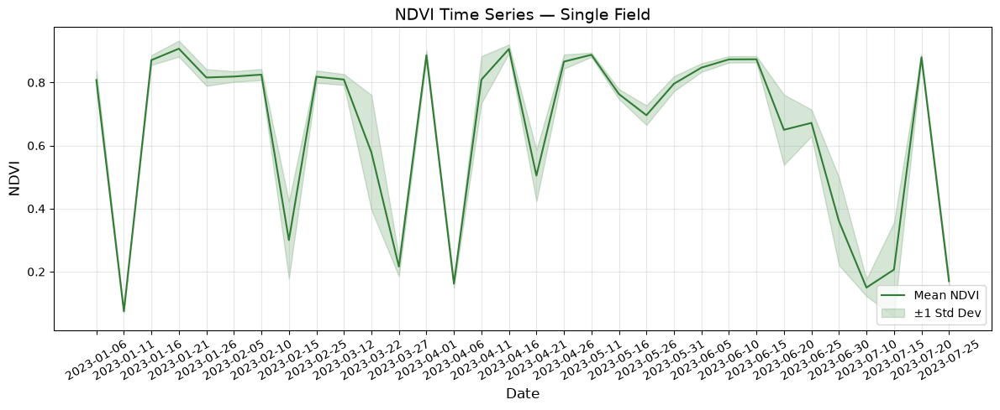

In [31]:
# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 5))

# Extract date, mean NDVI, and standard deviation from the dataframe
dates = result_df1['date']
ndvi_mean = result_df1['index_mean']
ndvi_std = result_df1['index_stDev']

# Plot mean NDVI as a line
ax.plot(dates, ndvi_mean, color='#2e7d32', linewidth=1.5, label='Mean NDVI')

# Add shaded region showing +/- 1 standard deviation
ax.fill_between(
    dates,
    ndvi_mean - ndvi_std,
    ndvi_mean + ndvi_std,
    alpha=0.2,
    color='#2e7d32',
    label='±1 Std Dev'
)

# Style the axes
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('NDVI', fontsize=12)
ax.set_title('NDVI Time Series — Single Field', fontsize=14)
ax.legend(loc='lower right')
ax.grid(True, alpha=0.3)
ax.tick_params(axis='x', rotation=30)
plt.tight_layout()

### Comparing different fields

Now that we have learned how to plot the data for the first field, let's take this another step forward and compare the NDVI time series for all five fields of interest. We will now run the same request for multiple fields and then transform the response into a single concatenated Pandas dataframe. In addition to making multiple requests, we will also use the PlanetScope Sandbox dataset to generate our NDVI time series statistics. 

In [ ]:
aggregation=SentinelHubStatistical.aggregation(
        evalscript=evalscript,
        time_interval=('2023-01-01T00:00:00Z', '2023-07-30T23:59:59Z'),
        aggregation_interval='P5D',
        resolution=[3,3],        
    )

input_data = SentinelHubStatistical.input_data(DataCollection.define_byoc('3f605f75-86c4-411a-b4ae-01c896f0e54e'))

ndvi_requests = []

for geo_shape in fields_gdf.geometry.values:
    request = SentinelHubStatistical(
        aggregation=aggregation,
        input_data=[input_data],
        geometry=Geometry(geo_shape, crs=CRS.WGS84),
        config=config,
    )
    ndvi_requests.append(request)

In [39]:
%%time

download_requests = [ndvi_request.download_list[0] for ndvi_request in ndvi_requests]

client = SentinelHubStatisticalDownloadClient(config=config)

ndvi_stats = client.download(download_requests)

len(ndvi_stats)

CPU times: total: 2.53 s
Wall time: 41.8 s


5

In [40]:
ndvi_dfs = [stats_to_df(polygon_stats) for polygon_stats in ndvi_stats]

for df, id in zip(ndvi_dfs, fields_gdf["id"].values):
    df["id"] = id

ndvi_df = pd.concat(ndvi_dfs)

# Replace string "NaN" with actual NaN, then drop rows with missing index values
ndvi_df = ndvi_df.replace("NaN", np.nan)
ndvi_df = ndvi_df.dropna(subset=[c for c in ndvi_df.columns if c not in ['id', 'interval_from', 'interval_to']])

ndvi_df

,interval_from,interval_to,index_B0_min,index_B0_max,index_B0_mean,index_B0_stDev,index_B0_sampleCount,index_B0_noDataCount,id
0,2023-01-06,2023-01-11,0.676650,0.876879,0.819447,0.024543,1575000,639053,1
1,2023-01-11,2023-01-16,0.044828,0.066824,0.055456,0.003475,1575000,639053,1
2,2023-01-16,2023-01-21,0.829512,0.921987,0.891000,0.012867,1575000,639053,1
3,2023-01-21,2023-01-26,0.778689,0.945714,0.880174,0.022465,1575000,639053,1
4,2023-01-26,2023-01-31,0.621432,0.745228,0.697524,0.021850,1575000,639053,1
...,...,...,...,...,...,...,...,...,...
27,2023-06-30,2023-07-05,0.140656,0.642049,0.359973,0.139516,1575000,684378,5
28,2023-07-10,2023-07-15,0.104682,0.281997,0.149602,0.027030,1575000,684378,5
29,2023-07-15,2023-07-20,0.064014,0.654255,0.206612,0.148897,1575000,684378,5
30,2023-07-20,2023-07-25,0.825304,0.900940,0.879809,0.010198,1575000,684378,5


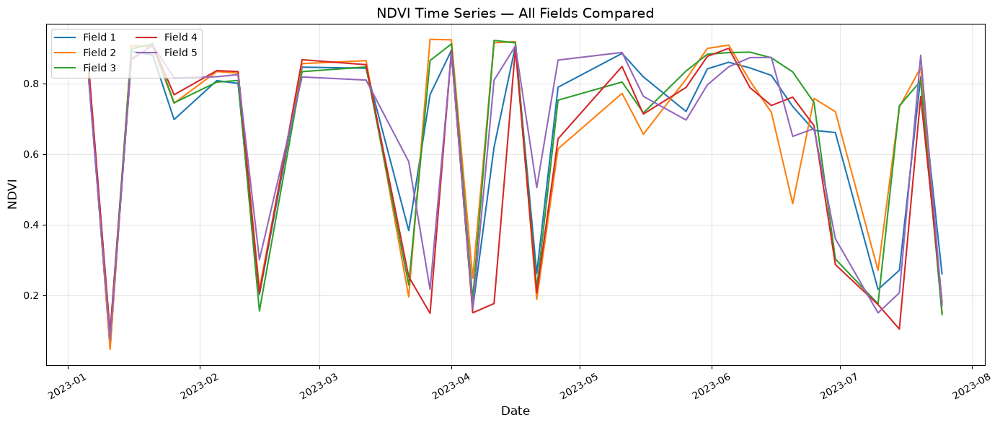

In [42]:
# Create figure and axis
fig, ax = plt.subplots(figsize=(14, 6))

# Plot each field's NDVI time series with a shaded std deviation band
for idx, field_id in enumerate(fields_gdf["id"].values):
    series = ndvi_df[ndvi_df["id"] == field_id]

    # Plot mean NDVI line for this field
    ax.plot(
        series["interval_from"].values,
        series["index_B0_mean"].values,
        color=f"C{idx}",
        linewidth=1.5,
        label=f"Field {field_id}"
    )

# Style the axes
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('NDVI', fontsize=12)
ax.set_title('NDVI Time Series — All Fields Compared', fontsize=14)
ax.legend(loc='upper left', ncol=2)
ax.grid(True, alpha=0.3)
ax.tick_params(axis='x', rotation=30)
plt.tight_layout()

## Summary

So what have we learned in this notebook?

- How to quickly access satellite imagery using the Processing API.
- How to visualize NDVI derived from satellite imagery 
- How to use the Statistical API to produce NDVI time series for single and multiple areas of interest.

This concludes this notebook on working with Planet Insights Platform APIs to access satellite imagery. For more information you can check out the [API Documentation](https://docs.planet.com/develop/apis/) and the [`sentinelhub-py` Python package](https://sentinelhub-py.readthedocs.io/en/latest/index.html) documentation.

## What to look at next?

- There are more tutorials for `sentinelhub-py` users [here](https://sentinelhub-py.readthedocs.io/en/latest/sh.html)
- If you are interested in machine learning, check out [EO-Learn](https://eo-learn.readthedocs.io/en/latest/index.html)
- You can find more use cases utilizing the Planet Insights Platform APIs [here](https://github.com/planetlabs/notebooks/tree/master/jupyter-notebooks)